## Exercise 1 (4 Points): Spectrograms based on periodogram (rectangular window), Hann taper and multitaper.

1. Load the seizure data from the file MG29S1.mat (Truccolo et al., Nature Neurosci, 2011). The file contains the variable “LFP” and the corresponding sample times in the variable “t”. The LFP was recorded from a microelectrode array intracortically implanted in the middle temporal gyrus of a person with pharmacologically intractable seizures. The LFP was downsampled to 1 kHz and has units in microvolts. The seizure starts at time zero and ends at about 66.5 seconds. Plot the LFP. Based on the visual inspection of the time domain signals, what are the main rhythms occurring during the seizure? Some of those rhythms may occur transiently for tens of seconds and then disappear, or they might gradually slow down in frequency.
2. Compute the spectrogram based on the periodogram (rectangular window), Hann taper, and the multitaper approaches. Adapt the code provided in the warm-up script. Use a time window W = 0.5 s and bandwidth R = 8 Hz. For the step size use half the size of the time window. Plot the corresponding spectrograms in dB as a 2D images (e.g. using imagesc.m), showing time in seconds and frequency in Hz. For guidance, you can refer to the spectrogram of the same data shown in the handout for Lecture 4. When converting to dB, do not normalize by the max power. How do the three approaches/spectrograms compare? How many different transient rhythms can be detected? What are their main frequency bands?

In [ ]:
#Pkg.add("MAT")
#Pkg.add("PlotlyJS")
#Pkg.add("DSP")
#Pkg.add("PyPlot")

In [1]:
using MAT
using PlotlyJS
using DSP
import PyPlot.imshow, PyPlot.subplots

### Question 1 

Load the seizure data from the file MG29S1.mat (Truccolo et al., Nature Neurosci, 2011). The file contains the variable “LFP” and the corresponding sample times in the variable “t”. The LFP was recorded from a microelectrode array intracortically implanted in the middle temporal gyrus of a person with pharmacologically intractable seizures. The LFP was downsampled to 1 kHz and has units in microvolts. The seizure starts at time zero and ends at about 66.5 seconds. Plot the LFP. Based on the visual inspection of the time domain signals, what are the main rhythms occurring during the seizure? Some of those rhythms may occur transiently for tens of seconds and then disappear, or they might gradually slow down in frequency.

In [2]:
#import data (as column vectors)
mat_vars = matread("MG29S1.mat")
lfp = vec(mat_vars["LFP"])
t = vec(mat_vars["t"])
N = length(t)

total_time = t[end]-t[1]

println("Loaded LFP signal with dimensions: ", size(lfp))
println("Loaded $(total_time) seconds of time with samples: ", N)

Loaded LFP signal with dimensions: (110000,)
Loaded 109.99900000000002 seconds of time with samples: 110000


In [3]:
# if IOPub rate error, restart jupyter with this settingts:
# jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000
lfp_trace = scatter(;x = t, y=vec(lfp), marker_color="blue", name="LFP", line_width=0.2)
layout = Layout(;title="LFP", legend=attr(family="Arial, sans-serif", size=20, color="grey"),
                 xaxis=attr(title="Time (s)"),
                 yaxis=attr(title="Power (μVolts)"))
plot([lfp_trace], layout)

In [5]:
#Plot Seizure Time
t0 = 20000
t65 = 85000
lfp_trace = scatter(;x = t[t0:t65], y=vec(lfp)[t0:t65], marker_color="blue", name="LFP", line_width=0.2)
layout = Layout(;title="LFP", legend=attr(family="Arial, sans-serif", size=20, color="grey"),
                 xaxis=attr(title="Time (s)"),
                 yaxis=attr(title="Power (μVolts)"))
plot([lfp_trace], layout)

### Question 2
* Compute the spectrogram based on the periodogram (rectangular window), Hann taper, and the multitaper approaches. Adapt the code provided in the warm-up script. Use a time window W = 0.5 s and bandwidth R = 8 Hz. For the step size use half the size of the time window. Plot the corresponding spectrograms in dB as a 2D images (e.g. using imagesc.m), showing time in seconds and frequency in Hz. For guidance, you can refer to the spectrogram of the same data shown in the handout for Lecture 4. When converting to dB, do not normalize by the max power. 

* How do the three approaches/spectrograms compare? 

_R: For plots and code see below. The spectograms were computed both using the skeleton provided in the warm-up code as well as the built-in spectrogram function part of the DSP.jl package (except for Multitaper Scpetrogram)_

_R: The rythms are the most distinct for the multitaper case_

* How many different transient rhythms can be detected? 
_R: I think 3_

* What are their main frequency bands?
_R $\sim$ 0Hz, 30Hz and 50Hz_

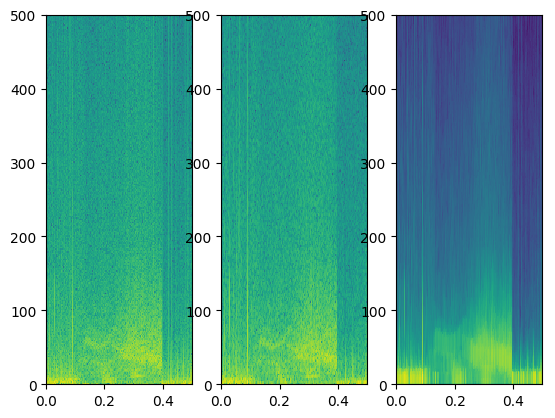

PyObject <matplotlib.image.AxesImage object at 0x1148959e8>

In [33]:
# Spectrogram: skeleton code ================================================
Fs=round(N/total_time)#sampling rate
W = 0.5 #window size in time
n = Int(round(W * Fs)) # number of samples in each moving time window
dt = 1/Fs;
df = 1/W; #frequency resolution
fNyquist=Fs/2;

# t is time for each of the N samples in the LFP variable
K = length(n+1:Int(round(n/2)):N-n)
tt = zeros(Float64, K)
Sp = zeros(Float64, Int(n/2 +1), K)
Sh = zeros(Float64, Int(n/2 +1), K)
Smt = zeros(Float64, Int(n/2 +1), K)


j=0;

X = lfp - mean(lfp) #subtract mean: zero DC shift

F = [0:df:fNyquist];#frequency grid

R = 8;#bandwidth in Hz - multitaper


mt_p = nothing

for k=n+1:Int(round(n/2)):N-n
    j=j+1
    tt[j]=t[k]
    
    x=X[k-n+1:k]
    
    # periodogram (rectangular taper)
    xf = fft(x)
    # One-sided power spectrum (periodogram)
    sp = dt^2 * 1/W * abs.(xf).^2 # dt^2 * 1/T * Xf.*conj(Xf);
    sp = 2 * sp[1:Int(n/2+1)]; #One-sided spectrum (i.e. only positive frequencies) for even n
    Sp[:,j] = sp            
    
    # Hanning taper
    h=hanning(n);
    xf=fft(h.*x);    
    sh = dt^2 * 1/W * abs.(xf).^2; # dt^2 * 1/T * Xf.*conj(Xf);
    sh = 2 * sh[1:Int(n/2+1)] #One-sided spectrum (i.e. only positive frequencies) for even N
    Sh[:,j] = sh 


    # Multitaper   
    # Note: mt_pgram doesn't take care of removing sample mean and temporal mean as in MATLAB. 
    # Do we need to do it manually?
    Smt[:,j] = power(mt_pgram(x; fs=Fs, nw=R))

end

fig, (ax1, ax2, ax3) = subplots(1,3)
ax1[:imshow](flipdim(10.*log10.(Sp),1), extent=[0, W, 0, 500], aspect="auto")
ax2[:imshow](flipdim(10.*log10.(Sh),1), extent=[0, W, 0, 500], aspect="auto")
ax3[:imshow](flipdim(10.*log10.(Smt),1), extent=[0, W, 0, 500], aspect="auto")

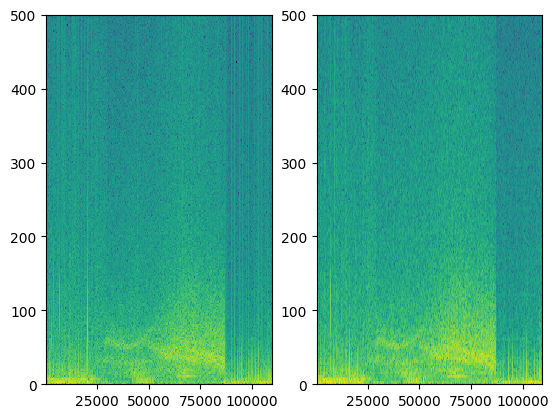

PyObject <matplotlib.image.AxesImage object at 0x12ccd2128>

In [49]:
## This uses the built-in spectogram function from DSP.jl

# Advantages: Takes care of overlap
# Note: Doesn't seem to handle the dpss case 

function plot_spectrograms_dsp(s, fs, w; nw=8)
    fig, (ax1, ax2) = subplots(1,2)
    Sp = spectrogram(s[:,1], convert(Int, w*fs),
                    convert(Int, round(w*fs/3)))
    t = time(Sp)
    f = freq(Sp)
    ax1[:imshow](flipdim(log10.(power(Sp)), 1), extent=[first(t), last(t),
             fs*first(f), fs*last(f)], aspect="auto")
    
    Sh = spectrogram(s[:,1], convert(Int, w*fs),
                    convert(Int, round(w*fs/3)), window=hanning)
    t = time(Sh)
    f = freq(Sh)
    ax2[:imshow](flipdim(log10.(power(Sh)), 1), extent=[first(t), last(t),
             fs*first(f), fs*last(f)], aspect="auto")
    
    #Spectogram doesn't seem to accept dpss
#     ntapers=ceil(2*nw)-1
#     Smt = spectrogram(s[:,1], convert(Int, w*fs),
#                     convert(Int, round(w*fs/3)), window=dpss(convert(Int, w*fs), nw, ntapers))
#     t = time(Sh)
#     f = freq(Sh)
#     ax2[:imshow](flipdim(log10(power(Sh)), 1), extent=[first(t), last(t),
#              fs*first(f), fs*last(f)], aspect="auto")
end
plot_spectrograms_dsp(X, Fs, W)

## References

1. Case Studies in Neural Analysis. Kreamer, Eden 2016
2. [DSP.jl](https://github.com/JuliaDSP/DSP.jl)
3. [Julia Intro to DSP post](http://www.seaandsailor.com/audiosp_julia.html)
